# ------------ Fluid mobility prediction from logging measurment with ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

# Import Models and Labraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import optuna
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import random
import os
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold 
from scipy.stats import skew 
from sklearn.pipeline import make_pipeline
import xgboost as xgb
from sklearn.linear_model import LinearRegression 
from scipy.interpolate import UnivariateSpline
import math
from scipy.signal import savgol_filter 

C:\Users\hp\anaconda3\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load the dataset

In [3]:
data1 = pd.read_excel('Mobility dataset with lithology.xlsx') # the dataset was collected from 6 well in a clay-sandstone oil reservoir
data = data1.copy()

In [4]:
data.shape

(172, 8)

In [5]:
data.head()

,depth,Neutron,Density,Resistivity,PHIE,Layer,Well,MOB
0,2786.9908,0.096524,2.496540,69.986619,0.102688,U3,BBK1,23.280960
1,2787.9269,0.108463,2.497758,38.129089,0.118129,U3,BBK1,22.463780
2,2788.5762,0.109845,2.484589,38.154890,0.088455,U3,BBK1,61.825140
3,2789.0534,0.098758,2.518072,1.051697,0.101560,U3,BBK1,2.735761
4,2790.0330,0.102687,2.509848,4.059840,0.102627,U3,BBK1,15.311000


In [6]:
data[['PHIE', 'Neutron', 'Density', 'Resistivity', 'MOB']].agg(['mean', 'std', 'min', 'max'])

,PHIE,Neutron,Density,Resistivity,MOB
mean,0.127562,0.126213,2.422739,28.650977,103.707313
std,0.027786,0.027327,0.060928,32.770853,69.256290
min,0.074546,0.078251,2.320257,0.787176,2.735119
max,0.189500,0.188718,2.576126,152.048590,229.834372


# Each parameter distrubition

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


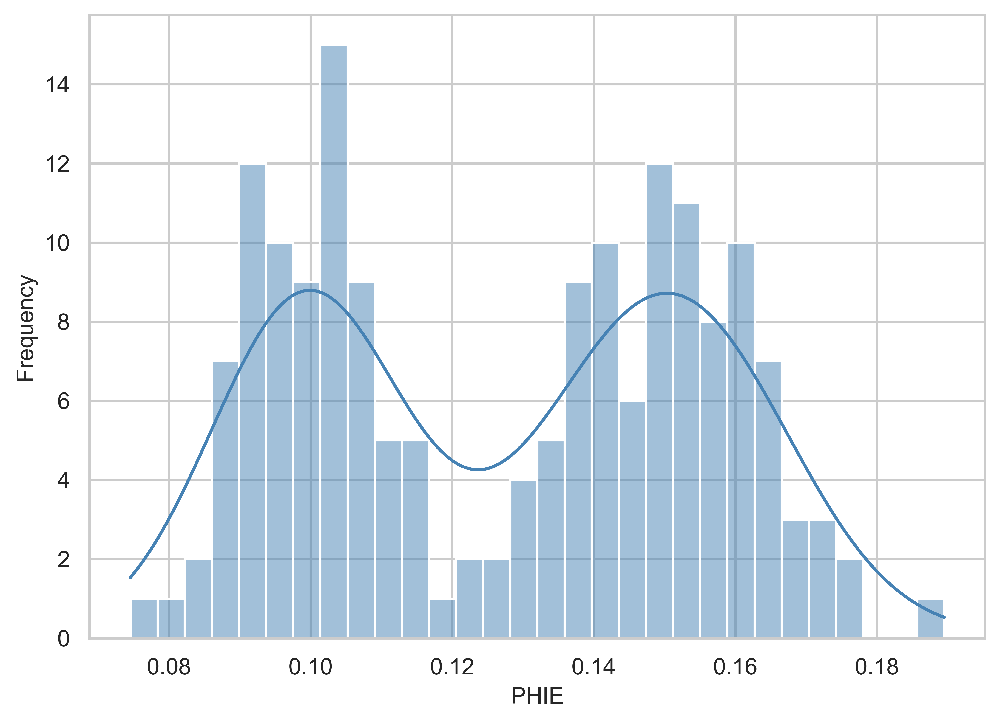

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


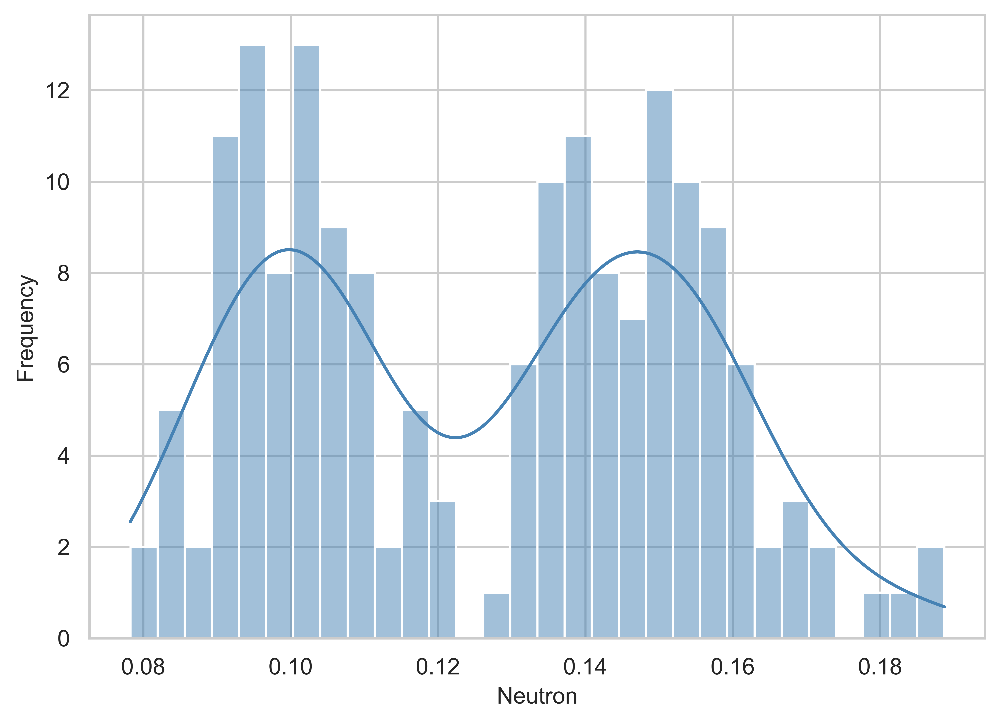

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


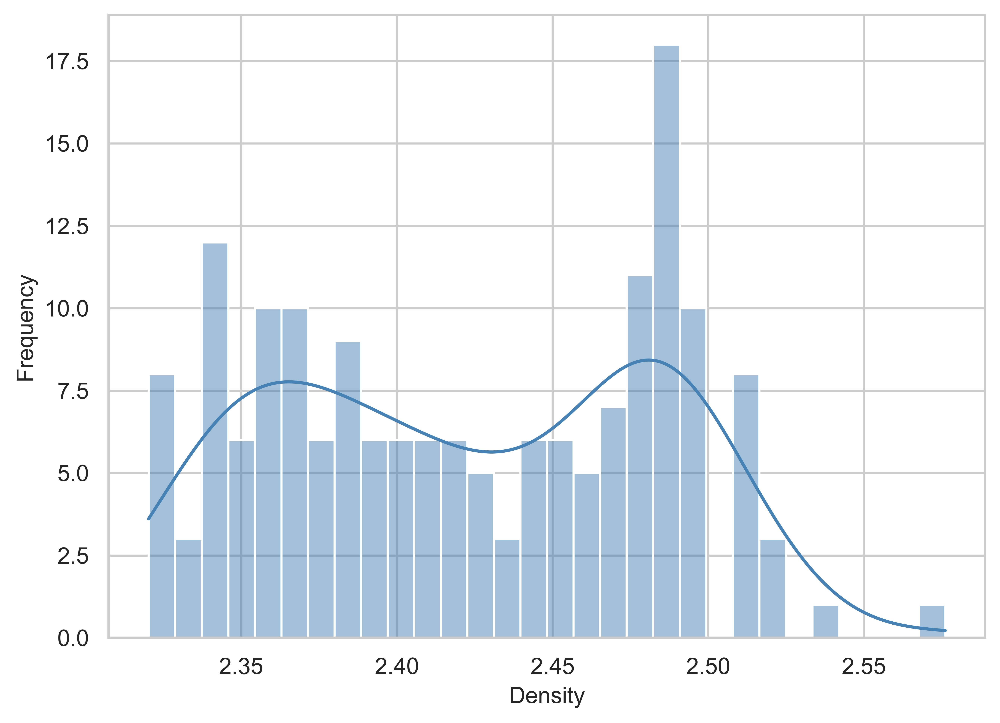

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


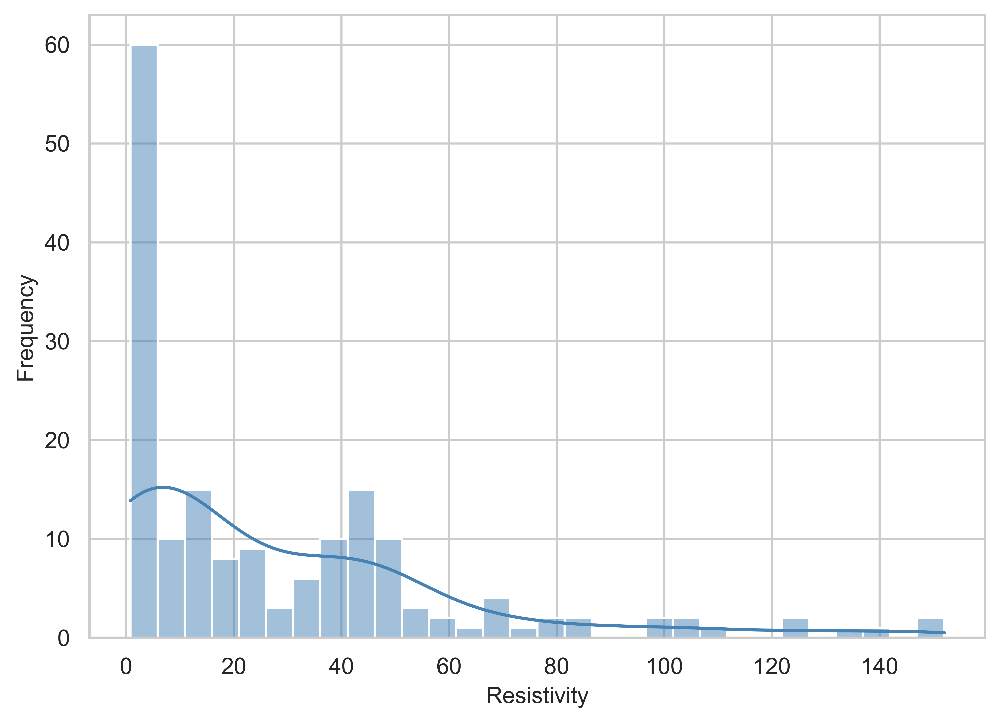

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


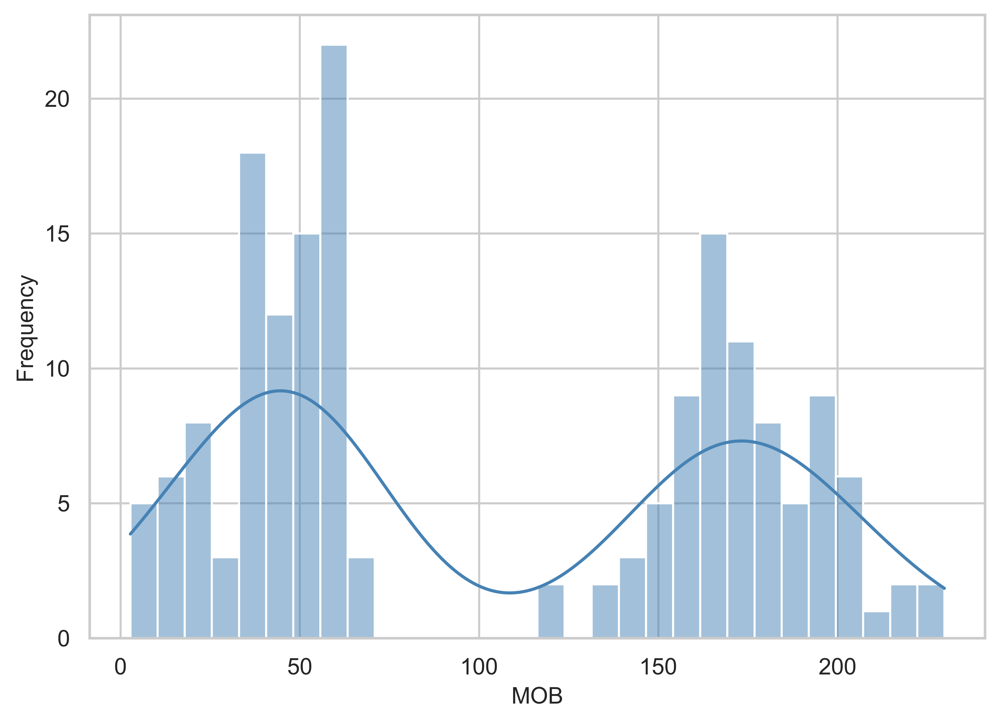

In [7]:
sns.set(style="whitegrid")

cols = ['PHIE', 'Neutron', 'Density', 'Resistivity', 'MOB']

for col in cols:
    plt.figure(figsize=(6.85, 5), dpi=800)
    
    sns.histplot(data[col], kde=True, bins=30, color='steelblue')
    
    plt.xlabel(col, fontsize=11)
    plt.ylabel("Frequency", fontsize=11)
    
    # Save figures (vector + raster)
    plt.savefig(f"{col}_distribution.eps", format='eps', dpi=800, bbox_inches='tight')
    plt.savefig(f"{col}_distribution.tif", format='tiff', dpi=600, bbox_inches='tight')
    
    plt.tight_layout()
    plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


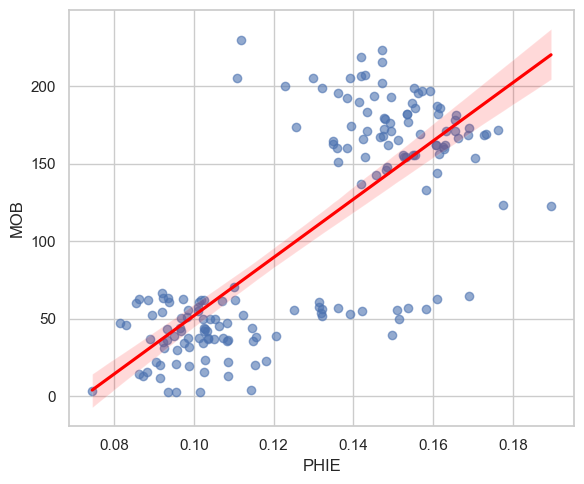

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


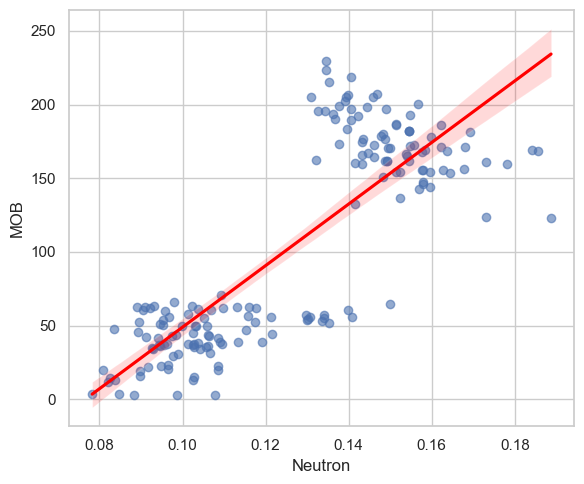

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


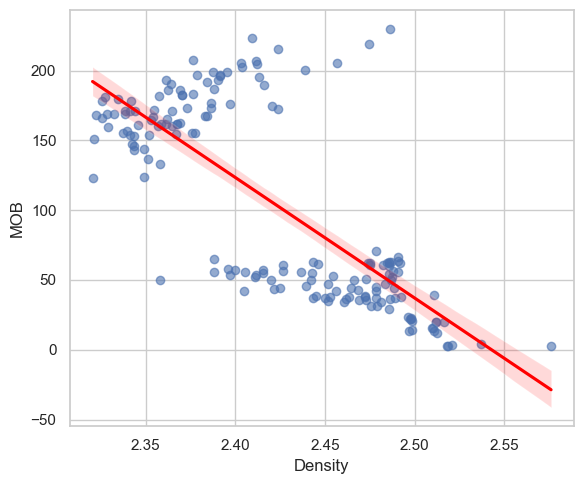

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


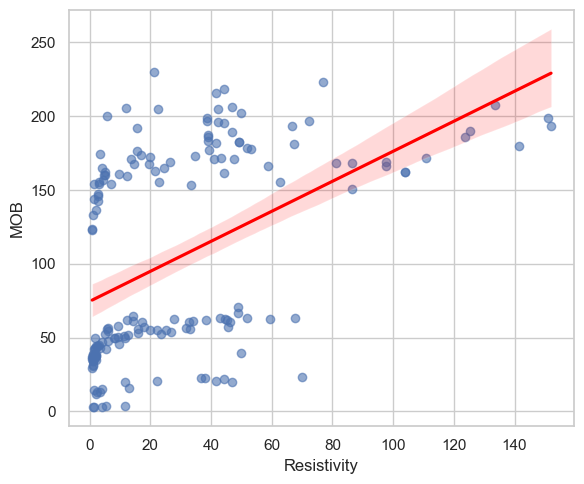

In [8]:
# Select features (MOB distrubition and correlation 
features = ['PHIE', 'Neutron', 'Density', 'Resistivity']
target = 'MOB'

sns.set(style="whitegrid")

for feature in features:
    
    plt.figure(figsize=(6, 5))
    
    # Plot
    sns.regplot(
        data=data,
        x=feature,
        y=target,
        scatter_kws={'alpha': 0.6},
        line_kws={'color': 'red'}
    )
      
    plt.tight_layout()
    
    # File names per feature
    filename_base = f"Fig_{feature}_vs_{target}"
    
    # Save
    plt.savefig(f"{filename_base}.tif", format="tiff", dpi=800, bbox_inches="tight")
    plt.savefig(f"{filename_base}.eps", format="eps", bbox_inches="tight")
    
    plt.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_35828\1545307674.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Layer", y="MOB", data=data, palette="viridis")


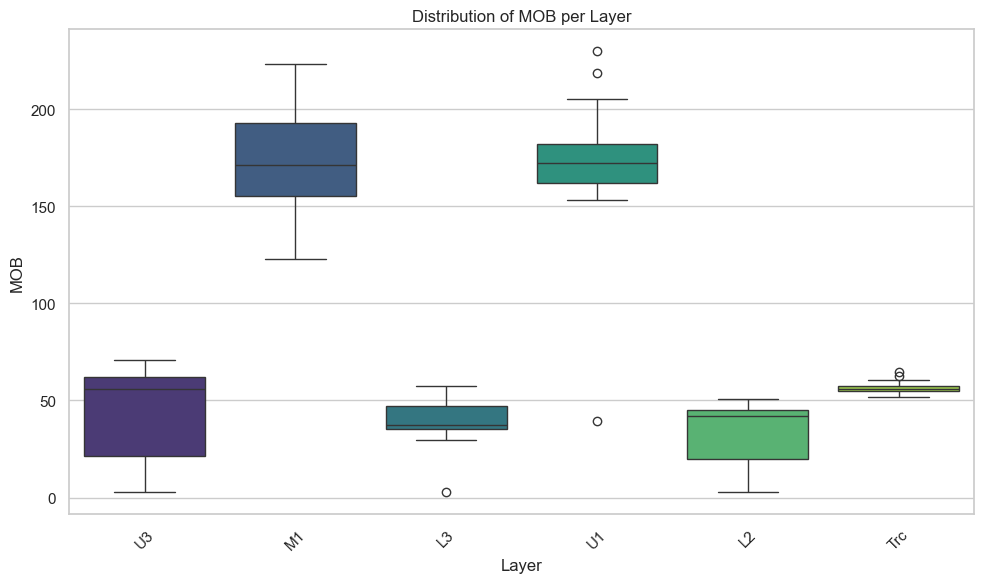

In [9]:
# Mobility distrubition in each layer
plt.figure(figsize=(10, 6))
sns.boxplot(x="Layer", y="MOB", data=data, palette="viridis")
plt.title("Distribution of MOB per Layer")
plt.ylabel("MOB")
plt.xlabel("Layer")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Logging and Mobility as a function of depth

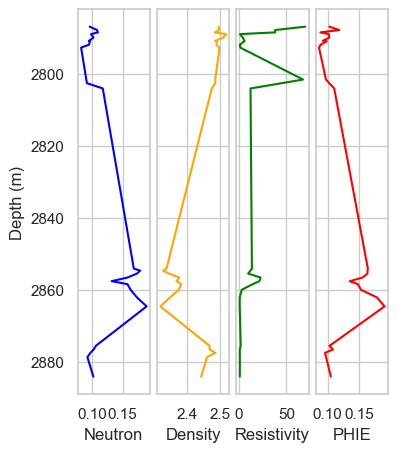

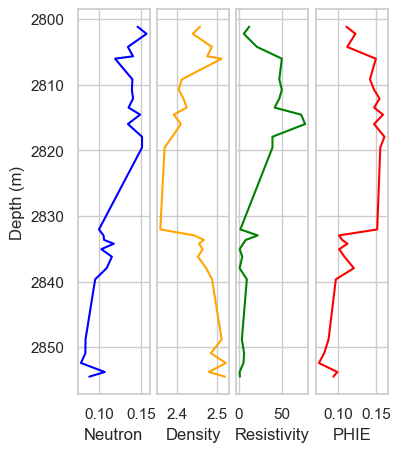

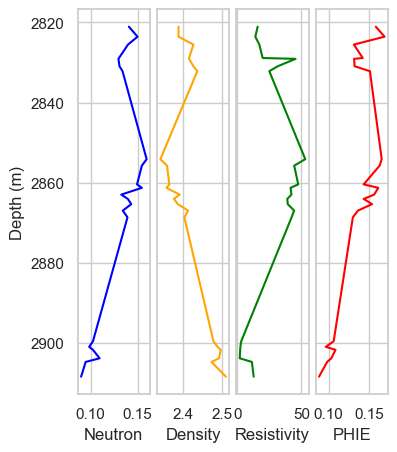

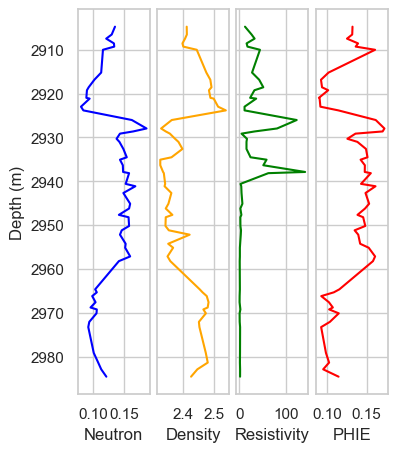

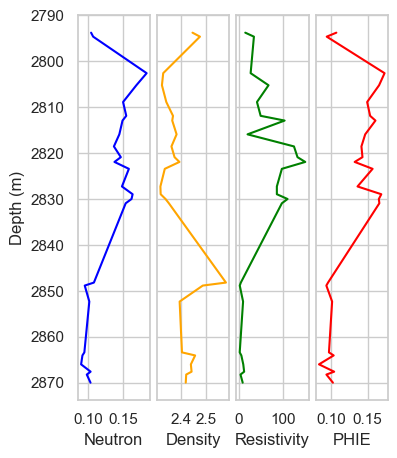

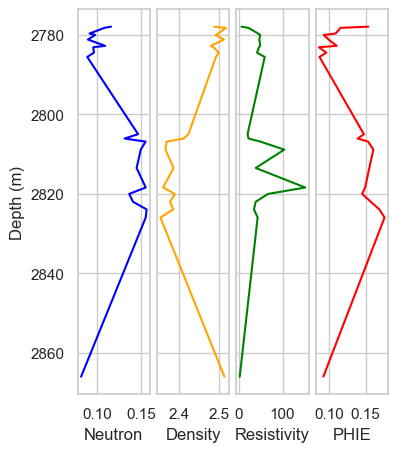

In [10]:
save_dir = "well_logs_figures"
os.makedirs(save_dir, exist_ok=True)

# Loop over wells
wells = data['Well'].unique()

for well in wells:
    well_data = data[data['Well'] == well]

    depth = well_data['depth']
    neutron = well_data['Neutron']
    density = well_data['Density']
    resistivity = well_data['Resistivity']
    phie = well_data['PHIE']

    # ====================
    # No smoothing; use raw values
    neutron_raw = neutron
    density_raw = density
    resistivity_raw = resistivity
    phie_raw = phie

    # ====================
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(4, 5), sharey=True)
    plt.subplots_adjust(wspace=0.1)

    axes[0].plot(neutron_raw, depth, color='blue')
    axes[0].set_xlabel('Neutron')
    axes[0].invert_yaxis()
    axes[0].grid(True)
    #axes[0].set_title('Neutron')

    axes[1].plot(density_raw, depth, color='orange')
    axes[1].set_xlabel('Density')
    axes[1].grid(True)
    #axes[1].set_title('Density')

    axes[2].plot(resistivity_raw, depth, color='green')
    axes[2].set_xlabel('Resistivity')
    axes[2].grid(True)
    #axes[2].set_title('Resistivity')

    axes[3].plot(phie_raw, depth, color='red')
    axes[3].set_xlabel('PHIE')
    axes[3].grid(True)
    #axes[3].set_title('PHIE')

    axes[0].set_ylabel('Depth (m)')
    file_path = os.path.join(save_dir, f"well_{well}.png")
    plt.savefig(file_path, dpi=500, bbox_inches='tight')
    plt.show()

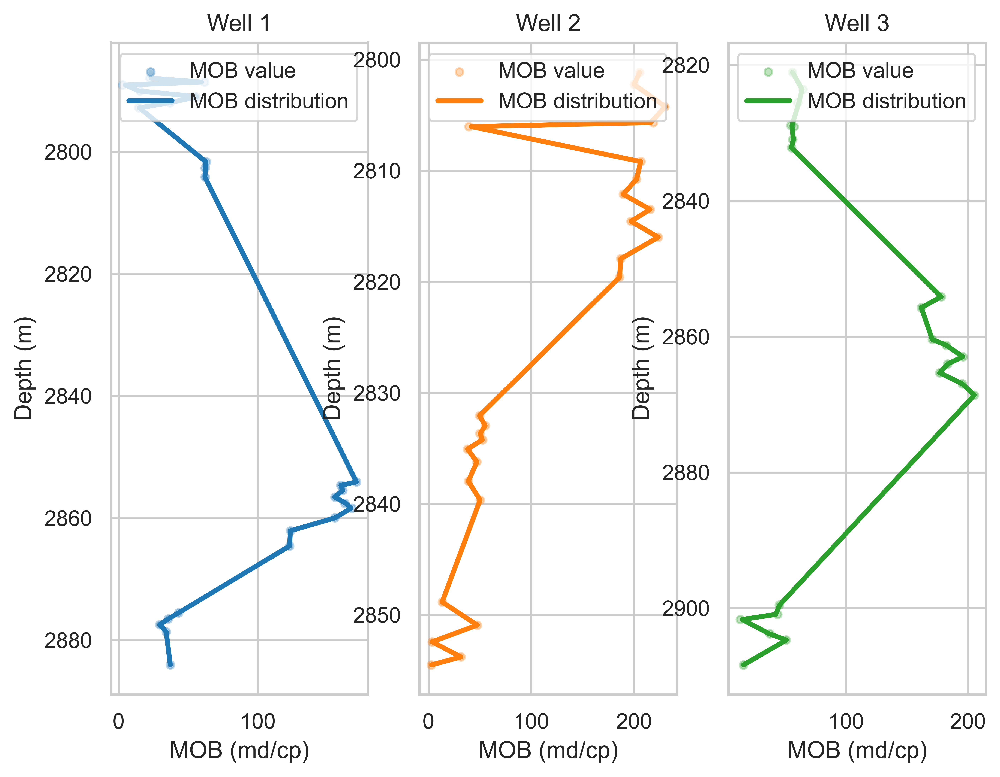

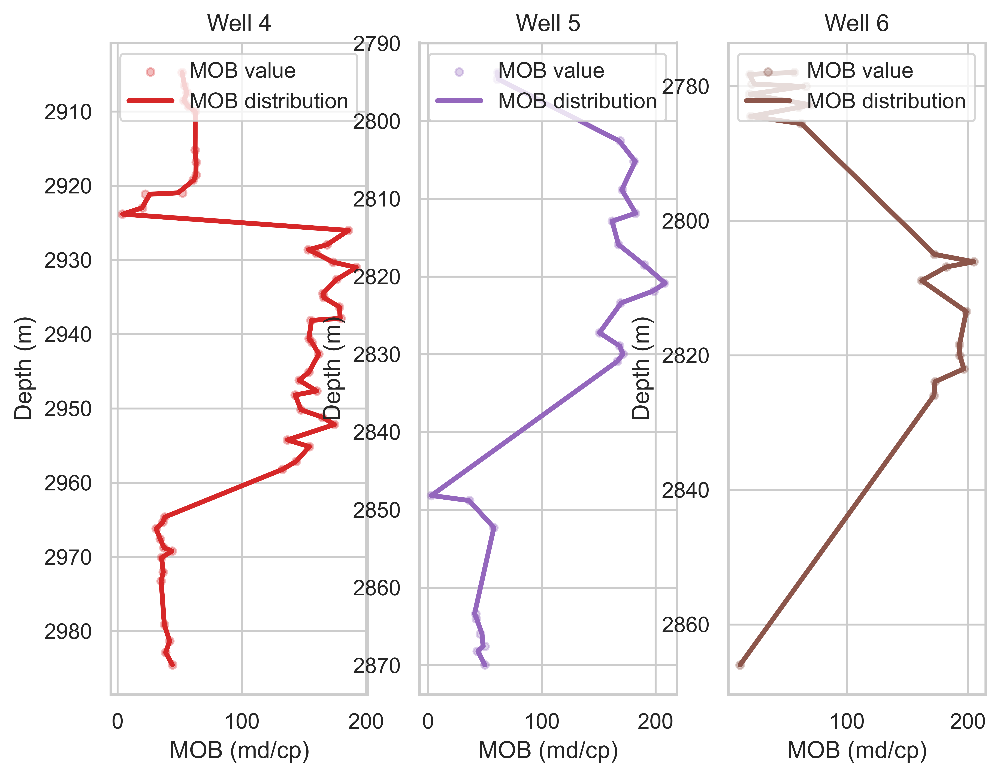

In [57]:
save_dir = "mob_plots"
os.makedirs(save_dir, exist_ok=True)

wells = data['Well'].unique()
palette = sns.color_palette("tab10", n_colors=len(wells))

# =========================
# Split wells into groups of 3
# =========================
group_size = 3

for i in range(0, len(wells), group_size):

    wells_subset = wells[i:i+group_size]
    colors_subset = palette[i:i+group_size]

    fig, axes = plt.subplots(1, 3, figsize=(8, 6), dpi=800, sharey=False)
    
    axes = np.array(axes).reshape(-1)

    for j, (ax, well, color) in enumerate(zip(axes, wells_subset, colors_subset)):

        well_data = data[data['Well'] == well]
        depth = well_data['depth'].values
        mob = well_data['MOB'].values

        # Sort by depth
        sort_idx = np.argsort(depth)
        depth_sorted = depth[sort_idx]
        mob_sorted = mob[sort_idx]

        # Smooth MOB
        spline = UnivariateSpline(depth_sorted, mob_sorted, s=len(depth_sorted)*0.5)
        mob_smooth = spline(depth_sorted)

        # Global well index (for naming)
        well_number = i + j + 1

        # Plot
        ax.scatter(mob_sorted, depth_sorted, color=color, s=15, alpha=0.3, label='MOB value')
        ax.plot(mob_smooth, depth_sorted, color=color, lw=2.5, label='MOB distribution')

        ax.invert_yaxis()
        ax.set_xlabel("MOB (md/cp)")
        ax.set_ylabel("Depth (m)")
        ax.set_title(f"Well {well_number}")
        ax.grid(True)
        ax.legend(loc='upper right')

    # Remove empty subplots
    for j in range(len(wells_subset), 3):
        fig.delaxes(axes[j])

    file_path = os.path.join(save_dir, f"MOB_group_{i//group_size + 1}.png")
    plt.savefig(file_path, dpi=500, bbox_inches='tight')

    plt.show()

# Outliers & Missing values detection and treatment

In [12]:
# calculate the missing value in the dataset
data.isnull().sum()

depth          0
Neutron        0
Density        0
Resistivity    0
PHIE           0
Layer          0
Well           0
MOB            0
dtype: int64

In [13]:
# No missing value exist so the next would not change the dataset
data = data.dropna(subset=['MOB','Resistivity','Neutron','Density','Layer'])

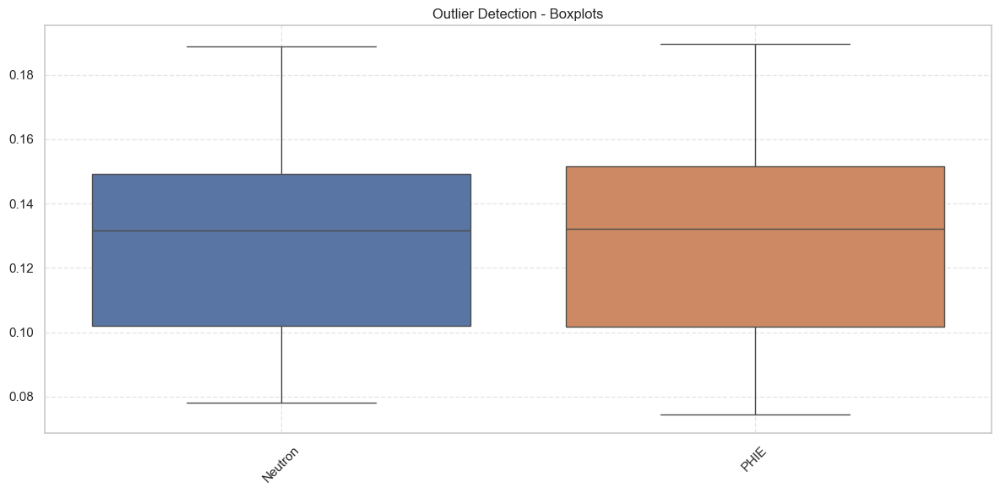

In [14]:
cols = ['Neutron','PHIE']

plt.figure(figsize=(12,6))
sns.boxplot(data=data[cols])

plt.title("Outlier Detection - Boxplots")
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

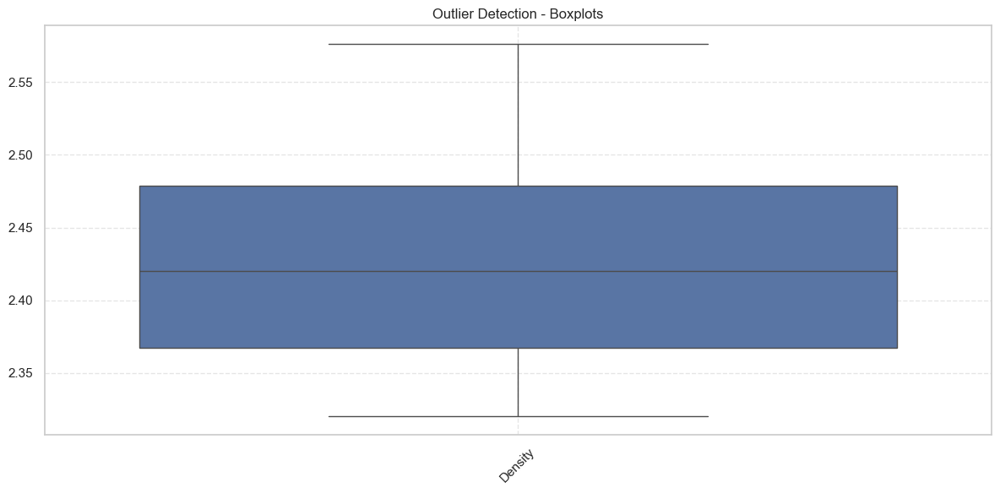

In [15]:
cols = ['Density']

plt.figure(figsize=(12,6))
sns.boxplot(data=data[cols])

plt.title("Outlier Detection - Boxplots")
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

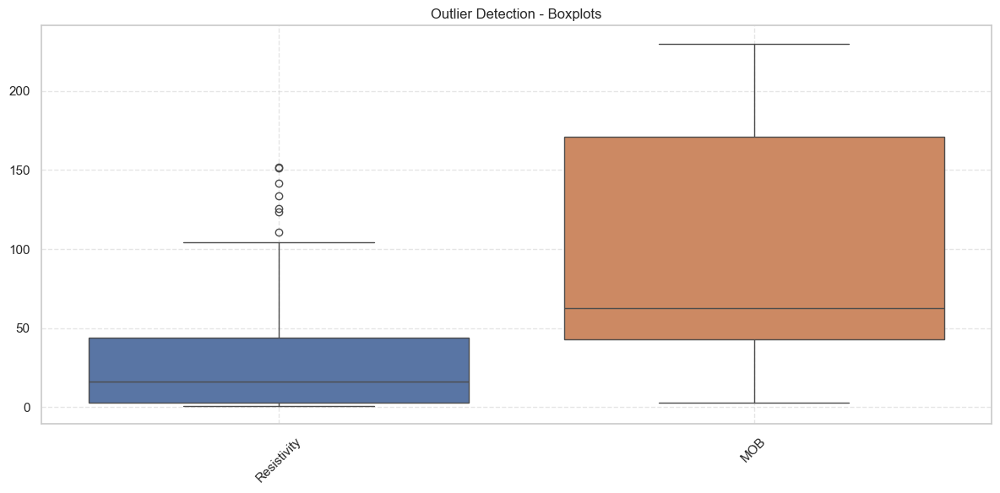

In [16]:
cols = ['Resistivity','MOB']

plt.figure(figsize=(12,6))
sns.boxplot(data=data[cols])

plt.title("Outlier Detection - Boxplots")
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [17]:
data.shape

(172, 8)

# Skewness reduction

In [18]:
# calculate skewness of each parame
skewness = data[['Resistivity','Neutron','Density','PHIE']].skew()

print("Skewness values:\n")
print(skewness)

Skewness values:

Resistivity    1.702992
Neutron        0.087856
Density        0.037227
PHIE           0.013377
dtype: float64


In [19]:
data['log_res'] = np.log10(data['Resistivity'] + 1e-5)

In [20]:
# verify the skewness value
skewness = data[['Neutron','Density','PHIE','log_res']].skew()

print("Skewness values:\n")
print(skewness)

Skewness values:

Neutron    0.087856
Density    0.037227
PHIE       0.013377
log_res   -0.306867
dtype: float64


In [21]:
# log transformation for the output to prevent small values from underfitting 
data['log_mob'] = np.log10(data['MOB'] + 1e-5)

# devide the dataset into input&output and train & test 

In [22]:
X = data[['Neutron', 'Density','log_res','Layer','PHIE']]  
y = data['log_mob']  

In [23]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Decode categorial variable (Layer)

In [24]:
num_cols = ['Neutron', 'Density','log_res','PHIE']
cat_cols = ["Layer"]
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

X_train_cat = encoder.fit_transform(X_train[cat_cols])
X_test_cat  = encoder.transform(X_test[cat_cols])


# Standardize numerical variables

In [25]:
scaler = StandardScaler()

X_train_num = scaler.fit_transform(X_train[num_cols])
X_test_num  = scaler.transform(X_test[num_cols])
X_train = np.hstack([X_train_num, X_train_cat])
X_test  = np.hstack([X_test_num, X_test_cat])

In [26]:
X_train = np.hstack([X_train_num, X_train_cat])
X_test = np.hstack([X_test_num, X_test_cat])

In [27]:
# Convert to DataFrame to see how does it look
X_train_df = pd.DataFrame(X_train)

X_train_df.head() 

,0,1,2,3,4,5,6,7,8,9
0,1.567205,-1.413962,-0.647944,1.305612,0.0,0.0,0.0,0.0,1.0,0.0
1,0.180184,-0.175125,0.899681,0.227239,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.260090,0.453352,-0.571090,-0.466817,0.0,1.0,0.0,0.0,0.0,0.0
3,-1.143974,1.048528,0.987289,-1.143436,0.0,0.0,0.0,0.0,0.0,1.0
4,0.678018,-0.647609,0.802879,1.026495,0.0,0.0,1.0,0.0,0.0,0.0


# polynomial model

In [28]:
model_poly = make_pipeline(
    PolynomialFeatures(degree=3, include_bias=False),
    LinearRegression()
)

# Fit the model
model_poly.fit(X_train, y_train)

# Predictions
y_pred = model_poly.predict(X_test)
y_train_pred = model_poly.predict(X_train)

# Evaluation
r2 = r2_score(y_test, y_pred)
print("📊 R² score for the polynomial model :", round(r2, 4))

📊 R² score for the polynomial model : -2.181


# /////////////////////////////////////////////////////////////////////

# XGBoost model

# /////////////////////////////////////////////////////////////////////

In [29]:
xgb_model = xgb.XGBRegressor(
    n_estimators=10,
    learning_rate=0.1,
    max_depth=5
)

# Train the model
xgb_model.fit(X_train, y_train)

# Predictions
y_train_pred = xgb_model.predict(X_train)
y_pred = xgb_model.predict(X_test)

Fold 1 → RMSE: 0.2563, R²: 0.7167
Fold 2 → RMSE: 0.1642, R²: 0.7460
Fold 3 → RMSE: 0.2338, R²: 0.7859
Fold 4 → RMSE: 0.1457, R²: 0.8386
Fold 5 → RMSE: 0.1887, R²: 0.8011
Fold 6 → RMSE: 0.1705, R²: 0.7555
Fold 7 → RMSE: 0.2182, R²: 0.8010
Fold 8 → RMSE: 0.2971, R²: 0.6216
Fold 9 → RMSE: 0.1980, R²: 0.7802


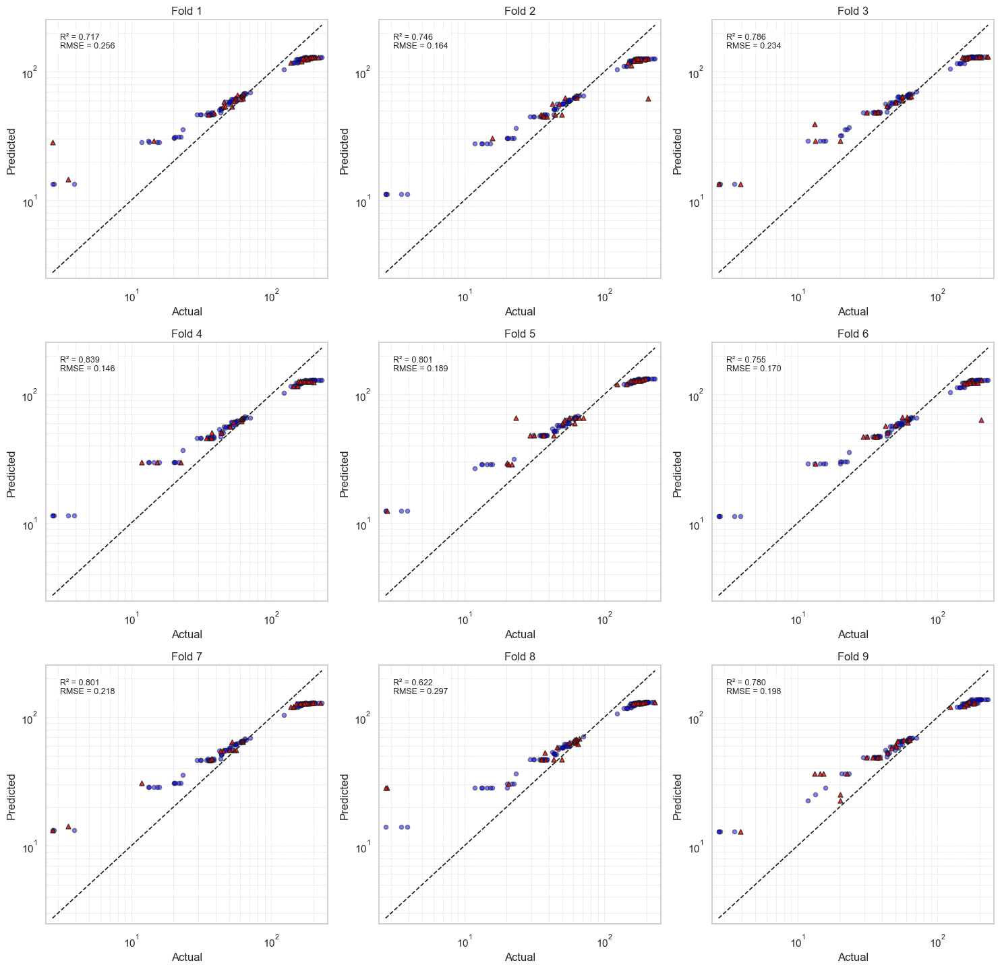

Average RMSE: 0.2081 ± 0.0456
Average R²  : 0.7607 ± 0.0595


In [30]:
X_train = np.asarray(X_train)
y_train = np.asarray(y_train)

# =========================
# Repeated K-Fold CV
# =========================
rkf = RepeatedKFold(
    n_splits=5,
    n_repeats=5
)

# =========================
# Store metrics
# =========================
r2_scores = []
rmse_scores = []

# =========================
# Create 3×3 subplot figure
# =========================
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

# =========================
# Cross-validation loop
# =========================
for fold, (train_index, val_index) in enumerate(rkf.split(X_train), 1):

    # Stop after 9 folds
    if fold > 9:
        break

    # Split data
    X_tr, X_val = X_train[train_index], X_train[val_index]
    y_tr, y_val = y_train[train_index], y_train[val_index]

    # =========================
    # XGBoost model
    # =========================
    model = xgb.XGBRegressor(
    n_estimators=10,
    learning_rate=0.1,
    max_depth=5,
    gamma=0,
    subsample=1
)

    # Train model
    model.fit(X_tr, y_tr)

    # =========================
    # Predictions
    # =========================
    y_pred = model.predict(X_val)
    y_train_pred = model.predict(X_tr)

    # =========================
    # Metrics
    # =========================
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))
    r2 = r2_score(y_val, y_pred)

    rmse_scores.append(rmse)
    r2_scores.append(r2)

    print(f"Fold {fold} → RMSE: {rmse:.4f}, R²: {r2:.4f}")

    # =========================
    # Back-transform 
    # =========================
    y_val_real = np.power(10, y_val)
    y_pred_real = np.power(10, y_pred)

    y_train_real = np.power(10, y_tr)
    y_train_pred_real = np.power(10, y_train_pred)

    # =========================
    # Select subplot
    # =========================
    ax = axes[fold - 1]

    # Training data
    ax.scatter(
        y_train_real,
        y_train_pred_real,
        color='blue',
        alpha=0.5,
        edgecolors='k',
        s=20
    )

    # Validation data
    ax.scatter(
        y_val_real,
        y_pred_real,
        color='red',
        marker='^',
        alpha=0.8,
        edgecolors='k',
        s=25
    )

    # Perfect fit line
    y_min = min(y_train_real.min(), y_val_real.min())
    y_max = max(y_train_real.max(), y_val_real.max())

    ax.plot(
        [y_min, y_max],
        [y_min, y_max],
        'k--',
        lw=1.2
    )

    # Log scale
    ax.set_xscale("log")
    ax.set_yscale("log")

    ax.set_xlim(y_min * 0.9, y_max * 1.1)
    ax.set_ylim(y_min * 0.9, y_max * 1.1)

    # Labels
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

    # Title
    ax.set_title(f"Fold {fold}")

    # Metrics text
    textstr = (
        f"R² = {r2:.3f}\n"
        f"RMSE = {rmse:.3f}"
    )

    ax.text(
        0.05,
        0.95,
        textstr,
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

    # Grid
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

# =========================
# Global figure settings
# ========================
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


print(
    f"Average RMSE: "
    f"{np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}"
)

print(
    f"Average R²  : "
    f"{np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}"
)

In [33]:
y_train_pred = xgb_model.predict(X_train)
y_pred = xgb_model.predict(X_test)

y_test_real = np.power(10, y_test)
y_pred_real = np.power(10, y_pred)
y_train_real = np.power(10, y_train)
y_train_pred_real = np.power(10, y_train_pred)

r2_test = r2_score(y_test, y_pred)
r2_train_real = r2_score(y_train_real, y_train_pred_real)
r2_test_real = r2_score(y_test_real, y_pred_real)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
rmse_real = np.sqrt(mean_squared_error(y_test_real, y_pred_real))

print("\n📊 FINAL NON TUNNED XGBoost MODEL PERFORMANCE")
print(f"Train R² : {r2_train_real:.4f}")
print(f"Test  R² : {r2_test:.4f}")
print(f"Test Real  R² : {r2_test_real:.4f}")
print(f"RMSE     : {rmse:.4f}")
print(f"RMSE Real    : {rmse_real:.4f}")



📊 FINAL NON TUNNED XGBoost MODEL PERFORMANCE
Train R² : 0.7384
Test  R² : 0.8519
Test Real  R² : 0.6697
RMSE     : 0.1213
RMSE Real    : 37.9233


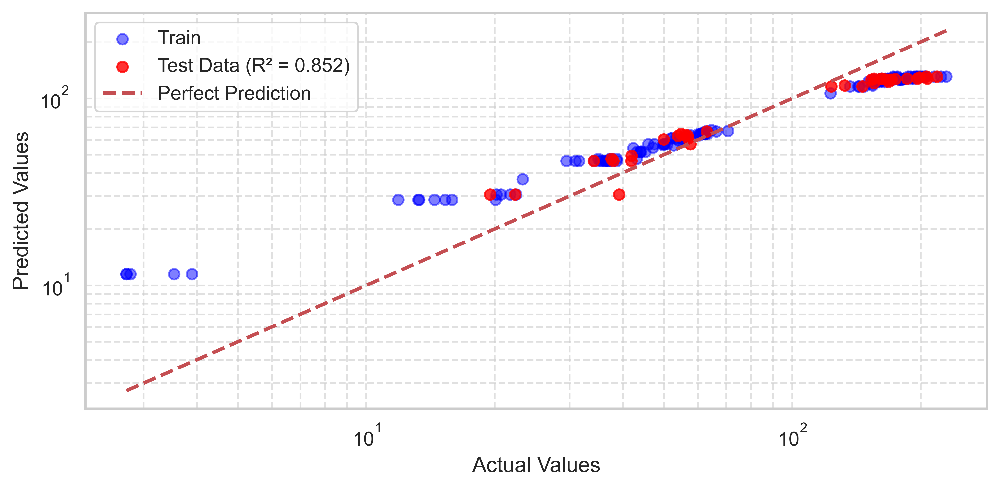

In [34]:
# =========================
# Plot 
# =========================
plt.figure(figsize=(8,4),dpi=800)

plt.scatter(y_train_real, y_train_pred_real, color='blue', alpha=0.5, label='Train')
plt.scatter(y_test_real, y_pred_real, color='red', alpha=0.8, label=f'Test Data (R² = {r2_test:.3f})')

min_val = min(y_train_real.min(), y_test_real.min())
max_val = max(y_train_real.max(), y_test_real.max())

plt.plot(
    [min_val, max_val],
    [min_val, max_val],
    'r--',
    linewidth=2,
    label='Perfect Prediction'
)

plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")

ax.set_xscale("log")
ax.set_yscale("log")

ax.plot(
        [y_min, y_max],
        [y_min, y_max],
        'k--',
        lw=1.2
    )

plt.xscale("log")
plt.yscale("log")
plt.grid(True, which="both", linestyle="--", alpha=0.6)
plt.legend()

plt.tight_layout()
plt.show()

# Tuned XGBoost hyperparameters

In [35]:
X_train = np.asarray(X_train)
y_train = np.asarray(y_train)

# =================================
# Repeated CV (5 split for 5 times)
# =================================
rkf = RepeatedKFold(n_splits=5, n_repeats=5)

def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 20, 500, log=True),
        "learning_rate": trial.suggest_float("learning_rate", 0.005, 0.5, log=True),
        "max_depth": trial.suggest_int("max_depth", 2, 12),
        "subsample": trial.suggest_float("subsample", 0.1, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.1, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 5),
        "reg_alpha" : trial.suggest_float("reg_alpha", 0, 5),
        "reg_lambda" : trial.suggest_float("reg_lambda", 0, 5)
    }

    r2_scores = []
    rmse_scores = []

    # Cross-validation split (rkf should be defined)
    for train_idx, val_idx in rkf.split(X_train):
        X_tr, X_val = X_train[train_idx], X_train[val_idx]
        y_tr, y_val = y_train[train_idx], y_train[val_idx]

        model = xgb.XGBRegressor(**params)
        model.fit(X_tr, y_tr)

        # Predictions
        y_pred = model.predict(X_val)


        # return the R² and RMSE on the log scale to prevent small values undersitting in the tunning

        r2_scores.append(r2_score(y_val, y_pred))
        rmse_scores.append(np.sqrt(mean_squared_error(y_val, y_pred)))

    return np.mean(r2_scores)

# =========================
# Optuna Study
# =========================
sampler = optuna.samplers.TPESampler(
    seed=38,
    multivariate=True,
    n_startup_trials=60
)

pruner = optuna.pruners.MedianPruner(
    n_startup_trials=60,
    n_warmup_steps=5
)

study = optuna.create_study(
    direction="maximize",
    sampler=sampler,
    pruner=pruner
)

study.optimize(objective, n_trials=800, show_progress_bar=False) 

# =========================
# Best hyperparameters
# =========================
print("\n✅ Best hyperparameters:")
print(study.best_params)

print(f"\n🎯 Best Repeated CV R² (physical space): {study.best_value:.4f}")

C:\Users\hp\anaconda3\Lib\site-packages\optuna\samplers\_tpe\sampler.py:319: ExperimentalWarning: ``multivariate`` option is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2026-05-31 12:04:43,841] A new study created in memory with name: no-name-061d0177-deea-4c37-a266-c72b690f3809
[I 2026-05-31 12:04:44,515] Trial 0 finished with value: 0.892974752540109 and parameters: {'n_estimators': 68, 'learning_rate': 0.2620509252910296, 'max_depth': 12, 'subsample': 0.7325424042496564, 'colsample_bytree': 0.6702706874542661, 'min_child_weight': 4, 'reg_alpha': 1.0006342142995224, 'reg_lambda': 1.936939438333506}. Best is trial 0 with value: 0.892974752540109.
[I 2026-05-31 12:04:44,893] Trial 1 finished with value: 0.1662655938158507 and parameters: {'n_estimators': 45, 'learning_rate': 0.007049926142203006, 'max_depth': 5, 'subsample': 0.49459073603144477, 'colsample_bytree': 0.5349241392305168, 'min_child_weight': 5, 'reg_alpha': 2.648146920021423, 'reg_l


✅ Best hyperparameters:
{'n_estimators': 440, 'learning_rate': 0.10219347459282736, 'max_depth': 2, 'subsample': 0.6620626072235561, 'colsample_bytree': 0.9250377528999447, 'min_child_weight': 1, 'reg_alpha': 0.10927198003380273, 'reg_lambda': 0.37176077103502714}

🎯 Best Repeated CV R² (physical space): 0.9614


# Plot the first 9 folds of the repeated cross-validation result

In [44]:
r2_scores = []
rmse_scores = []

fig, axes = plt.subplots(3, 3, figsize=(18, 8),dpi=800)
axes = axes.flatten()

# =========================
# Cross-validation loop
# =========================
for fold, (train_index, val_index) in enumerate(rkf.split(X_train), 1):

    # Stop after 9 folds
    if fold > 9:
        break

    # =========================
    # Split data
    # =========================
    X_tr, X_val = X_train[train_index], X_train[val_index]
    y_tr, y_val = y_train[train_index], y_train[val_index]

    # =========================
    # XGBoost model using Optuna best parameters
    # =========================
    model = xgb.XGBRegressor(
        **study.best_params
    )

    # =========================
    # Train model
    # =========================
    model.fit(X_tr, y_tr)

    # =========================
    # Predictions
    # =========================
    y_pred = model.predict(X_val)
    y_train_pred = model.predict(X_tr)

    # =========================
    # Metrics
    # =========================
    rmse = np.sqrt(mean_squared_error(y_val, y_pred))
    r2 = r2_score(y_val, y_pred)

    rmse_scores.append(rmse)
    r2_scores.append(r2)

    print(f"Fold {fold} → RMSE: {rmse:.4f}, R²: {r2:.4f}")

    # =========================
    # Back-transform (log10 → real scale)
    # =========================
    y_val_real = np.power(10, y_val)
    y_pred_real = np.power(10, y_pred)

    y_train_real = np.power(10, y_tr)
    y_train_pred_real = np.power(10, y_train_pred)

    # =========================
    # Select subplot
    # =========================
    ax = axes[fold - 1]

    # =========================
    # Training data
    # =========================
    ax.scatter(
        y_train_real,
        y_train_pred_real,
        color='blue', alpha=0.6, label='Train'
    )

    # =========================
    # Validation data
    # =========================
    ax.scatter(
        y_val_real,
        y_pred_real,
        color='red', alpha=0.8,
        label='Validation'
    )
    # =========================
    # Perfect fit line
    # =========================
    y_min = min(y_train_real.min(), y_val_real.min())
    y_max = max(y_train_real.max(), y_val_real.max())

    ax.plot(
        [y_min, y_max],
        [y_min, y_max],
        'k--',
        lw=1.2
    )

    # =========================
    # Log scale
    # =========================
    ax.set_xscale("log")
    ax.set_yscale("log")

    ax.set_xlim(y_min * 0.9, y_max * 1.1)
    ax.set_ylim(y_min * 0.9, y_max * 1.1)

    # =========================
    # Labels
    # =========================
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")

    # =========================
    # Title
    # =========================
    ax.set_title(f"Fold {fold}")

    # =========================
    # Metrics text
    # =========================
    textstr = (
        f"R² = {r2:.3f}\n"
        f"RMSE = {rmse:.3f}"
    )

    ax.text(
        0.07,
        0.95,
        textstr,
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='top',
        bbox=dict(
            boxstyle='round',
            facecolor='white',
            alpha=0.8
        )
    )

    # =========================
    # Grid
    # =========================
    ax.grid(
        True,
        which='both',
        linestyle='--',
        linewidth=0.5,
        alpha=0.7
    )

    ax.legend(fontsize=8)


filename_base = f"rep_cross_validation_XGBoost"

plt.savefig(f"{filename_base}.tif", format="tiff", dpi=800, bbox_inches="tight")


plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

print("\n📊 Repeated Cross-Validation Results for XGBoost:")

print(
    f"Average RMSE: "
    f"{np.mean(rmse_scores):.4f} ± {np.std(rmse_scores):.4f}"
)

print(
    f"Average R²  : "
    f"{np.mean(r2_scores):.4f} ± {np.std(r2_scores):.4f}"
)

Fold 1 → RMSE: 0.0837, R²: 0.9505
Fold 2 → RMSE: 0.0896, R²: 0.9571
Fold 3 → RMSE: 0.1355, R²: 0.9030
Fold 4 → RMSE: 0.0976, R²: 0.9424
Fold 5 → RMSE: 0.0726, R²: 0.9780
Fold 6 → RMSE: 0.0629, R²: 0.9834
Fold 7 → RMSE: 0.0634, R²: 0.9569
Fold 8 → RMSE: 0.1442, R²: 0.9178
Fold 9 → RMSE: 0.0475, R²: 0.9887



📊 Repeated Cross-Validation Results for XGBoost:
Average RMSE: 0.0886 ± 0.0310
Average R²  : 0.9531 ± 0.0273


# Evaluate final best model on the testset

In [37]:
best_params = study.best_params

model_best =  xgb.XGBRegressor(
        **best_params
    )

model_best.fit(X_train, y_train)
# =========================
# Predictions
# =========================
y_train_pred = model_best.predict(X_train)
y_pred       = model_best.predict(X_test)
y_test_real = np.power(10, y_test)
y_pred_real = np.power(10, y_pred)

r2_train = r2_score(y_train, y_train_pred)
r2_test  = r2_score(y_test, y_pred)
r2_test_real  = r2_score(y_test_real, y_pred_real)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
rmse_real = np.sqrt(mean_squared_error(y_test_real, y_pred_real))
mae  = mean_absolute_error(y_test, y_pred)

print("\n📊 FINAL MODEL PERFORMANCE")
print(f"Train R² : {r2_train:.4f}")
print(f"Test  R² : {r2_test:.4f}")
print(f"Test Real  R² : {r2_test_real:.4f}")
print(f"RMSE     : {rmse:.4f}")
print(f"RMSE Real    : {rmse_real:.4f}")
print(f"MAE      : {mae:.4f}")


📊 FINAL MODEL PERFORMANCE
Train R² : 0.9978
Test  R² : 0.9818
Test Real  R² : 0.9709
RMSE     : 0.0425
RMSE Real    : 11.2639
MAE      : 0.0311


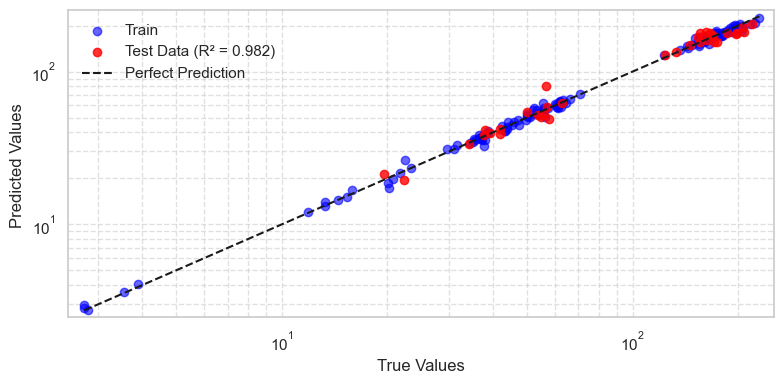

In [38]:
# plot final model performance on testset
plt.figure(figsize=(8, 4))

# =========================
# Back-transform (log10 → real scale)
# =========================
y_test_real = np.power(10, y_test)
y_pred_real = np.power(10, y_pred)

y_train_real = np.power(10, y_train)
y_train_pred_real = np.power(10, y_train_pred)

plt.scatter(y_train_real, y_train_pred_real, color='blue', alpha=0.6, label='Train')
plt.scatter(y_test_real, y_pred_real, color='red', alpha=0.8, label=f'Test Data (R² = {r2_test:.3f})')
# =========================
# Perfect line y=x
# =========================
y_min = min(y_train_real.min(), y_test_real.min())
y_max = max(y_train_real.max(), y_test_real.max())

plt.plot([y_min, y_max], [y_min, y_max],
         'k--', lw=1.5, label="Perfect Prediction")

# =========================
# Log scale for the plot 
# =========================
plt.xscale("log")
plt.yscale("log")

plt.xlim(y_min * 0.9, y_max * 1.1)
plt.ylim(y_min * 0.9, y_max * 1.1)

# =========================
# Labels
# =========================
plt.xlabel("True Values", fontsize=12)
plt.ylabel("Predicted Values ", fontsize=12)

plt.legend(frameon=False)
plt.grid(True, which="both", linestyle="--", alpha=0.6)

plt.tight_layout()

plt.show()

# Average Absolute Relative Error

In [40]:
abs_rel_ero_tes = np.mean(np.abs((y_test_real- y_pred_real)/y_test_real))
abs_rel_ero_tra = np.mean(np.abs((y_train_real- y_train_pred_real)/y_train_pred_real))
print(abs_rel_ero_tes)
print(abs_rel_ero_tra)

0.07273268655719646
0.03498433596899748


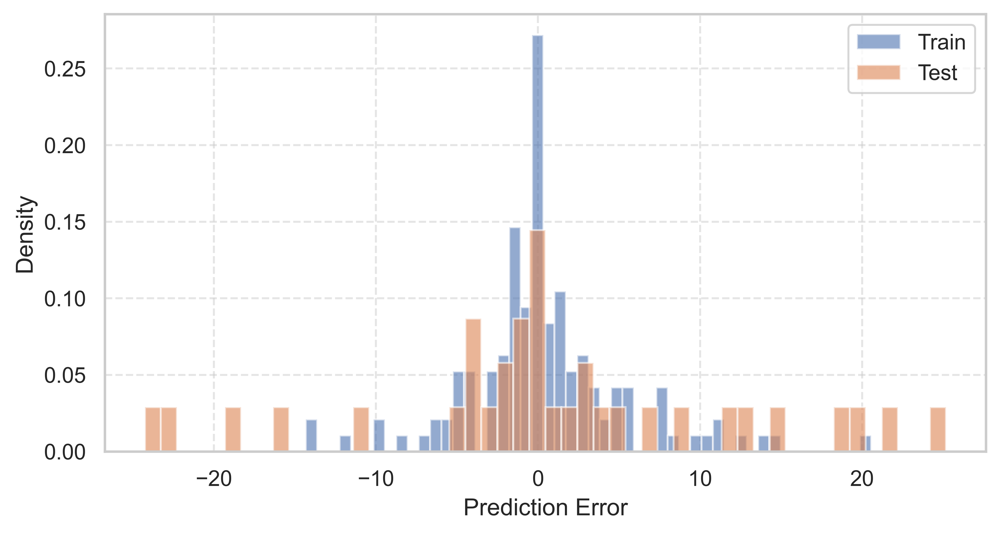

In [39]:
error_train = y_train_real - y_train_pred_real
error_test  = y_test_real  - y_pred_real

plt.figure(figsize=(8,4),dpi=600)

# Histogram for train
plt.hist(error_train, bins=50, alpha=0.6, label='Train', density=True)

# Histogram for test
plt.hist(error_test, bins=50, alpha=0.6, label='Test', density=True)

plt.xlabel("Prediction Error")
plt.ylabel("Density")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

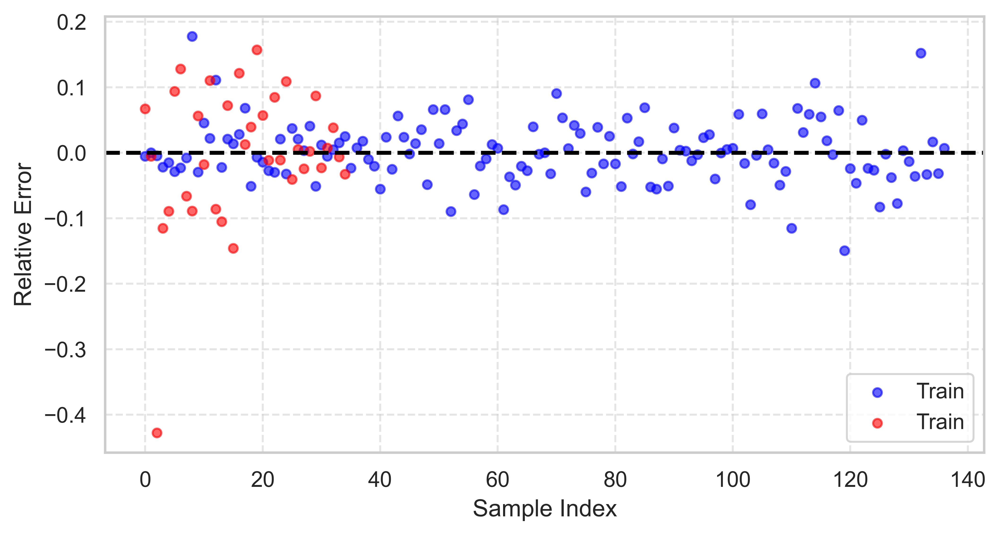

In [41]:
error_test = (y_test_real- y_pred_real)/y_test_real
error_train  = (y_train_real- y_train_pred_real)/y_train_pred_real


plt.figure(figsize=(8,4),dpi=600)

# Histogram for train
plt.scatter(range(len(error_train)), error_train, color='blue', alpha=0.6, label='Train', s=20)

# Histogram for test
plt.scatter(range(len(error_test)), error_test, color='red', alpha=0.6, label='Train', s=20)
plt.axhline(y=0, color='black', linestyle='--', linewidth=2)
plt.xlabel("Sample Index")
plt.ylabel("Relative Error")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# AARE for XGBoost and GPBoost

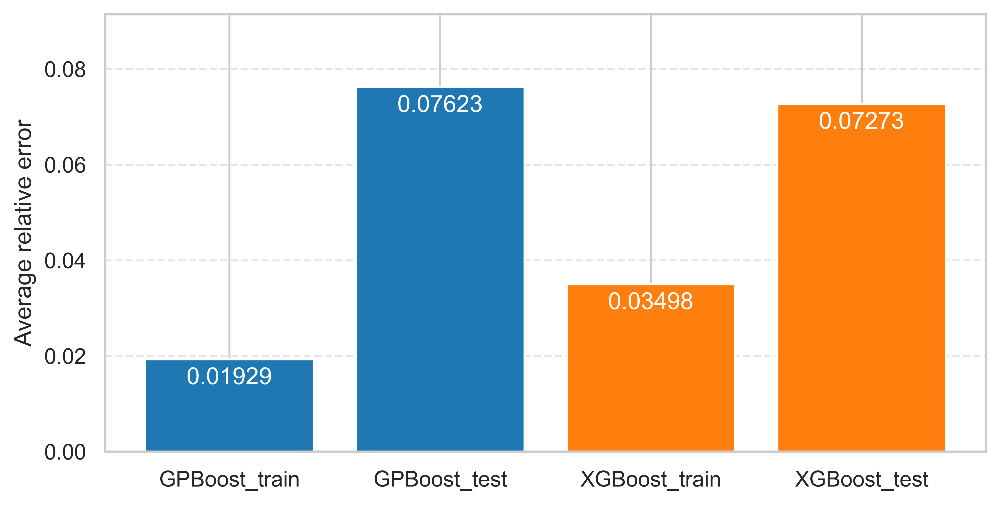

In [45]:
models = ['GPBoost_train','GPBoost_test','XGBoost_train','XGBoost_test']
errors = [0.01929,0.07623,0.03498,0.07273]

plt.figure(figsize=(8,4), dpi=600)

colors = ['tab:blue', 'tab:blue', 'tab:orange', 'tab:orange']

bars = plt.bar(models, errors, color=colors[:len(models)])

# add labels inside bars
plt.bar_label(bars, labels=[f"{e:.5f}" for e in errors], padding=-15, color='white')

plt.ylabel('Average relative error')
plt.ylim(0, max(errors)*1.2)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.show()